In [1]:
from cartoGRAPHs import *
import random 
from sklearn.decomposition import PCA
from sklearn import preprocessing
import json
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt 
import colorsys

/opt/anaconda3/envs/Exposurome/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


DEBUG: in init: import done


_____
# G G N / gene-gene network 
_____

In [2]:

datatable = pd.read_csv('output/final_backbone_gene_graph_significant_combo_ji_df.tsv', delimiter='\t', index_col=0)
datatable

,Gene A,Gene B,alpha,weight
0,AR,MYC,0.0361,0.136959
1,AR,ABCB1,0.0148,0.119674
2,AR,CASP3,0.0013,0.102315
3,AR,CASP8,0.0292,0.100084
4,AR,AKT1,0.0150,0.106467
...,...,...,...,...
695184,MIR4791,MIR7,0.0588,1.000000
695185,MIR548BA,MIR7,0.0588,1.000000
695186,MIR553,MIR890,0.0807,1.000000
695187,MIR1301,MIR658,0.0134,1.000000


In [3]:
G = nx.from_pandas_edgelist(datatable, 'Gene A', 'Gene B')
print('G nodes: ',len(G.nodes())) 
print('G edges: ',len(G.edges()))




with open('output/Communities/Louvain/gg_com_first_louvain_genes.pickle', 'rb') as handle:
    first_level_louvain = pickle.load(handle)

with open('output/Communities/Louvain/gg_com_second_louvain_genes.pickle', 'rb') as handle:
    second_level_louvain = pickle.load(handle)

with open('output/Communities/Louvain/gg_com_third_louvain_genes.pickle', 'rb') as handle:
    third_level_louvain = pickle.load(handle)

with open('output/Communities/Louvain/gg_first_louvain_iteration.pickle', 'rb') as handle:
    gg_first_level_louvain = pickle.load(handle)

with open('output/Communities/Louvain/gg_second_louvain_iteration.pickle', 'rb') as handle:
    gg_second_level_louvain = pickle.load(handle)



G nodes:  22201
G edges:  695189


### calculate features based on communities 
+ #1 THIRD LEVEL COMMUNITIES 

In [4]:
layout_method = 'third-level-louvain' 

d_comm_third = {}
for g in G.nodes():
    for k,v in third_level_louvain.items():
        if g in v:
            d_comm_third[g] = k

d_communities_third = {}
for g in G.nodes():
    intermed_list = [0]*len(third_level_louvain.keys())
    for k,v in third_level_louvain.items():
        if g in v:
            intermed_list[k] = 1
    d_communities_third[g] = intermed_list
d_nodefeatures_third = d_comm_third

FM_communities_third = pd.DataFrame(d_communities_third).T

print(len(third_level_louvain))
FM_communities_third

92


,0,1,2,3,4,5,6,7,8,9,...,82,83,84,85,86,87,88,89,90,91
AR,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MYC,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABCB1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CASP3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CASP8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MIR890,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR1301,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR658,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR371B,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


+ #2 SECOND LEVEL COMMUNITITES

In [5]:
layout_method = 'second-level-louvain' 

d_comm_second = {}
for g in G.nodes():
    for k,v in second_level_louvain.items():
        if g in v:
            d_comm_second[g] = k

d_communities_second = {}
for g in G.nodes():
    intermed_list = [0]*len(second_level_louvain.keys())
    for k,v in second_level_louvain.items():
        if g in v:
            intermed_list[k] = 1
    d_communities_second[g] = intermed_list
d_nodefeatures_second = d_comm_second

FM_communities_second = pd.DataFrame(d_communities_second).T

print(len(second_level_louvain))
FM_communities_second

96


,0,1,2,3,4,5,6,7,8,9,...,86,87,88,89,90,91,92,93,94,95
AR,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MYC,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABCB1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CASP3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CASP8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MIR890,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
MIR1301,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
MIR658,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
MIR371B,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


+ #3 FIRST LEVEL COMMUNITIES

In [6]:
layout_method = 'first-level-louvain' 

d_comm_first = {}
for g in G.nodes():
    for k,v in first_level_louvain.items():
        if g in v:
            d_comm_first[g] = k

d_communities_first = {}
for g in G.nodes():
    intermed_list = [0]*len(first_level_louvain.keys())
    for k,v in first_level_louvain.items():
        if g in v:
            intermed_list[k] = 1
    d_communities_first[g] = intermed_list
d_nodefeatures_first = d_comm_first

FM_communities_first = pd.DataFrame(d_communities_first).T

print(len(first_level_louvain))
FM_communities_first

284


,0,1,2,3,4,5,6,7,8,9,...,274,275,276,277,278,279,280,281,282,283
AR,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MYC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABCB1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CASP3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CASP8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MIR890,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR1301,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR658,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR371B,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
r = 0.9
alpha = 1.0

A = nx.adjacency_matrix(G, nodelist=list(G.nodes()))
DM_m = rnd_walk_matrix2(A, r, alpha, len(G.nodes()))
FM_structural = pd.DataFrame(DM_m)
FM_structural.sum(axis=1) # axis=1 for columns i.e. features = sum 1
FM_structural.index=list(G.nodes())
FM_structural.columns=list(G.nodes())
FM_structural

,AR,MYC,ABCB1,CASP3,CASP8,AKT1,HIF1A,MAPK1,MAPK3,MAPK8,...,MIR3529,MIR4791,MIR548BA,MIR7,MIR553,MIR890,MIR1301,MIR658,MIR371B,MIR4468
AR,0.900089,0.000666,0.001096,0.001366,0.000946,0.000966,0.000711,0.001068,0.001044,0.000754,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
MYC,0.001401,0.900075,0.001106,0.001378,0.000970,0.000992,0.000745,0.001086,0.001063,0.000784,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ABCB1,0.001403,0.000673,0.900096,0.001377,0.000955,0.000975,0.000718,0.001078,0.001055,0.000761,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CASP3,0.001387,0.000665,0.001092,0.900074,0.000948,0.000968,0.000714,0.001069,0.001045,0.000754,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CASP8,0.001391,0.000678,0.001097,0.001375,0.900071,0.000985,0.000728,0.001079,0.001056,0.000769,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MIR890,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.090909,0.909091,0.000000,0.000000,0.000000,0.000000
MIR1301,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.909091,0.090909,0.000000,0.000000
MIR658,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.090909,0.909091,0.000000,0.000000
MIR371B,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.909091,0.090909


___ 
# 1 VIS 1 - Visualizing 1 selected community of each level
___

## Complete GGN network - Vis

In [24]:
########################################
# select which level :
########################################

layoutname = 'thirdlevel'
x_level_louvain = third_level_louvain
d_comm = d_comm_third
FM_communities = FM_communities_third

# set visualization parameters (i.e. colors for communities, node size, features.. )
colorlist_verybright = ['#FF355E','#FF6037','#FF9933',
               '#FFCC33', '#FFFF66', '#CCFF00','#A7F432',
                '#AAF0D1', '#50BFE6', '#FF6EFF',
                '#FF00CC', 
]

colorlist_paper = ['#44c8f5', '#00aeef', '#64a8c5', # blues
                    '#f15a29','#f9a86b', '#ffe6cb' ,#reds
                    '#fbb040', '#fecd8a' , #orange-yellows
                    '#c65d7d', '#f79d8d', '#7a2d45','#a47179', #pinks 
                    '#676267', '#6b777e', '#93909a', '#a7a9ac' #greys    
                ]

colorlist_fin = colorlist_paper * (len(x_level_louvain.keys())//len(colorlist_paper)) +colorlist_paper

# #try to get unique colors for each community instead of hardcoded colors 
# colorlist_fin_rgb = sns.color_palette("gist_rainbow", n_colors = len(x_level_louvain.keys()))
# colorlist_fin = [mcolors.to_hex(rgb) for rgb in colorlist_fin_rgb]
# random.shuffle(colorlist_fin)
print("number of unique colors:" ,len(set(colorlist_fin)))

# assign random color to each community
d_comm_col = dict(zip(x_level_louvain.keys(), colorlist_fin))
print(len(d_comm_col))

# match community colors assigned to nodes-community assignment
d_nodecolors_hex = {} 
for node,comm in d_comm.items():
    for com,col in d_comm_col.items():
        if comm == com:
            d_nodecolors_hex[node] = col 

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25

edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'

# get all subgraphs of all communities : 
nodes_allcommunities = []
subgraphs_allcommunities = []

for number_of_community in range(min(d_comm.values()),max(d_comm.values())+1):

    nodes_comm0 = []
    for node, comm in d_comm.items(): 
        if comm == number_of_community:
            nodes_comm0.append(node)
            G_comm0 = G.subgraph(nodes_comm0)

    nodes_allcommunities.append(nodes_comm0)
    subgraphs_allcommunities.append(G_comm0)

number of unique colors: 16
92


### FEATURE MODULATED LAYOUT 
structural (global) with functional (communities)

In [9]:
scalar_val = 1
layout_method = 'modulated-scal'+str(scalar_val)
DF_structural = FM_structural
DF_functional = FM_communities.T
DF_merge = feature_modulation(DF_structural,DF_functional, scalar_val)

n_n = 8
spr = 1.0
md = 0.5
metr2D = 'cosine'

posG2D_modulated = layout_portrait_umap(G,
                                   DF_merge,
                                   2,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

posG2D_new = posG2D_modulated



/opt/anaconda3/envs/Exposurome/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
python(46494) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


In [10]:

ggn_col_dict={}
for gene,pos in posG2D_new.items():
    for i,n_comm in enumerate(nodes_allcommunities):
        if gene in n_comm:
            ggn_col_dict[gene]=d_comm_col[i]



In [18]:
with open('output/ggn_col_dict.pickle', 'wb') as handle:
    pickle.dump(ggn_col_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)


In [11]:
#Let's change the names of these communities based on their size

#BROADEST==third
third_level_louvain_sort=dict(sorted(third_level_louvain.items(), key=lambda item: len(item[1]), reverse = True))
third_renamed_third_conversion_dict={}
renamed_third_level_louvain_sort={}
c=1
for com,explist in third_level_louvain_sort.items():
    renamed_third_level_louvain_sort[str(c)]=explist
    third_renamed_third_conversion_dict[com]=str(c)
    c=c+1
    
#MIDDLE==second

second_renamed_second_conversion_dict={}
renamed_second_level_louvain_sort={}

for br_com,mid_com in gg_second_level_louvain.items():
    if len(mid_com)==1:
        newcom=third_renamed_third_conversion_dict[br_com]
        renamed_second_level_louvain_sort[newcom]=second_level_louvain[mid_com[0]]
        second_renamed_second_conversion_dict[mid_com[0]]=newcom
    else:
        sorted_list=list(sorted(mid_com, key=lambda item: len(second_level_louvain[item]), reverse = True))
        for i in range(len(sorted_list)):
            q=i+1
            newcom=third_renamed_third_conversion_dict[br_com]+"_"+str(q)
            renamed_second_level_louvain_sort[newcom]=second_level_louvain[sorted_list[i]]
            second_renamed_second_conversion_dict[sorted_list[i]]=newcom
        
#FINEST==first  

first_renamed_first_conversion_dict={}
renamed_first_level_louvain_sort={}

for mid_com,fin_com in gg_first_level_louvain.items():
    if len(fin_com)==1:
        newcom=second_renamed_second_conversion_dict[mid_com]
        renamed_first_level_louvain_sort[newcom]=first_level_louvain[fin_com[0]]
        first_renamed_first_conversion_dict[fin_com[0]]=newcom
    else:
        sorted_list=list(sorted(fin_com, key=lambda item: len(first_level_louvain[item]), reverse = True))
        for i in range(len(sorted_list)):
            q=i+1
            newcom=second_renamed_second_conversion_dict[mid_com]+"_"+str(q)
            renamed_first_level_louvain_sort[newcom]=first_level_louvain[sorted_list[i]]
            first_renamed_first_conversion_dict[sorted_list[i]]=newcom
        

In [12]:
#We are using the new nomenclature
fine_grained_communities_list=[]
middle_communities_list=[]
broad_communities_list=[]

for com,explist in renamed_first_level_louvain_sort.items():
    comlist=com.split("_")
    if len(comlist)==1:
        fine_grained_communities_list.append(com)
    elif len(comlist)==2:
        fine_grained_communities_list.append(com)
        middle_communities_list.append(comlist[0])
    else:
        fine_grained_communities_list.append(com)
        middle_communities_list.append(comlist[0]+"_"+comlist[1])
        broad_communities_list.append(comlist[0])

fine_grained_communities_set=set(fine_grained_communities_list)
middle_communities_set=set(middle_communities_list)
broad_communities_set=set(broad_communities_list)
print(len(broad_communities_set))  
print(len(middle_communities_set))  
print(len(fine_grained_communities_set))  

4
19
284


In [13]:
third_renamed_third_conversion_dict_rev={}
for k,v in third_renamed_third_conversion_dict.items():
    third_renamed_third_conversion_dict_rev[v]=k

second_renamed_second_conversion_dict_rev={}
for k,v in second_renamed_second_conversion_dict.items():
    second_renamed_second_conversion_dict_rev[v]=k

first_renamed_first_conversion_dict_rev={}
for k,v in first_renamed_first_conversion_dict.items():
    first_renamed_first_conversion_dict_rev[v]=k

In [13]:
for k,v in gg_second_level_louvain.items():
    if 56 in v:
        print(k,v)

13 [56]


In [66]:
for k,v in gg_first_level_louvain.items():
    if 56 in v:
        print(k,v)

56 [138, 128, 144, 21, 212, 142, 185, 228, 162, 166, 153, 127, 229, 16, 202, 95, 194, 22, 222, 276, 81, 209, 264, 248, 204, 168, 220, 3, 56, 256, 167, 178, 19, 243, 86, 146, 263, 201, 210, 214, 219, 46]


In [60]:
second_renamed_second_conversion_dict_rev['7']

56

In [74]:
first_renamed_first_conversion_dict_rev['7_9']

248

In [14]:

gg_fine_grained_dict = {}
for fg_com in fine_grained_communities_set:
    gg_fine_grained_dict[fg_com] = first_level_louvain[first_renamed_first_conversion_dict_rev[fg_com]]

gg_middle_dict = {}
for fg_com in middle_communities_set:
    gg_middle_dict[fg_com] = second_level_louvain[second_renamed_second_conversion_dict_rev[fg_com]]

gg_broad_dict = {}
for fg_com in broad_communities_set:
    gg_broad_dict[fg_com] = third_level_louvain[third_renamed_third_conversion_dict_rev[fg_com]]


In [30]:
#Let's save these communities

with open('output/Communities/Louvain/gg_Louvain_fine_grained_dict.pickle', 'wb') as handle:
    pk.dump(gg_fine_grained_dict, handle, protocol=pk.HIGHEST_PROTOCOL)
    
with open('output/Communities/Louvain/gg_Louvain_middle_dict.pickle', 'wb') as handle:
    pk.dump(gg_middle_dict, handle, protocol=pk.HIGHEST_PROTOCOL)
    
with open('output/Communities/Louvain/gg_Louvain_broad_dict.pickle', 'wb') as handle:
    pk.dump(gg_broad_dict, handle, protocol=pk.HIGHEST_PROTOCOL)

In [16]:
tot_v=[]
for k,v in renamed_second_level_louvain_sort.items():
    tot_v.extend(v)
len(tot_v)

22201

In [15]:
tremap_color_dict={}
for com,explist in renamed_third_level_louvain_sort.items():
    col_list=[]
    for exp in explist:
        col_list.append(ggn_col_dict[exp])
    if len(set(col_list))==1:
        tremap_color_dict[com]=col_list[0]
    else:
        print("%s is multicolor"%com)

for com,explist in renamed_second_level_louvain_sort.items():
    col_list=[]
    for exp in explist:
        col_list.append(ggn_col_dict[exp])
    if len(set(col_list))==1:
        tremap_color_dict[com]=col_list[0]
    else:
        print("%s is multicolor"%com)
        
for com,explist in renamed_first_level_louvain_sort.items():
    col_list=[]
    for exp in explist:
        col_list.append(ggn_col_dict[exp])
    if len(set(col_list))==1:
        tremap_color_dict[com]=col_list[0]
    else:
        print("%s is multicolor"%com)
len(tremap_color_dict)

307

In [16]:

color_list=[]
com_list=[]
value_list=[]
parent_list=[]

for com, color in tremap_color_dict.items():
    com_list.append(com)
    color_list.append(color)
    
    comgrouplist=com.split("_")
    if len(comgrouplist)==1:
        value_list.append(len(renamed_third_level_louvain_sort[com]))
        parent_list.append("")
    
    elif len(comgrouplist)==2:
        try:
            value_list.append(len(renamed_second_level_louvain_sort[com]))
            oldcom=second_renamed_second_conversion_dict_rev[com]
            for brcom,midcomlist in gg_second_level_louvain.items():
                if oldcom in midcomlist:
                    parent_list.append(third_renamed_third_conversion_dict[brcom])
        except:
            value_list.append(len(renamed_first_level_louvain_sort[com]))
            oldcom=first_renamed_first_conversion_dict_rev[com]
            for midcom,fincomlist in gg_first_level_louvain.items():
                if oldcom in fincomlist:
                    parent_list.append(second_renamed_second_conversion_dict[midcom])
            
        
    else:
        value_list.append(len(renamed_first_level_louvain_sort[com]))
        oldcom=first_renamed_first_conversion_dict_rev[com]
        for midcom,fincomlist in gg_first_level_louvain.items():
            if oldcom in fincomlist:
                parent_list.append(second_renamed_second_conversion_dict[midcom])

In [17]:
import plotly.graph_objects as go


fig = go.Figure(go.Treemap(
    branchvalues = "total",
    labels = com_list,
    values = value_list,
    parents = parent_list,
    marker_colors = color_list
))

fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.write_image('output/Figures/SF7B_v02.pdf')
fig.show()

python(48146) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


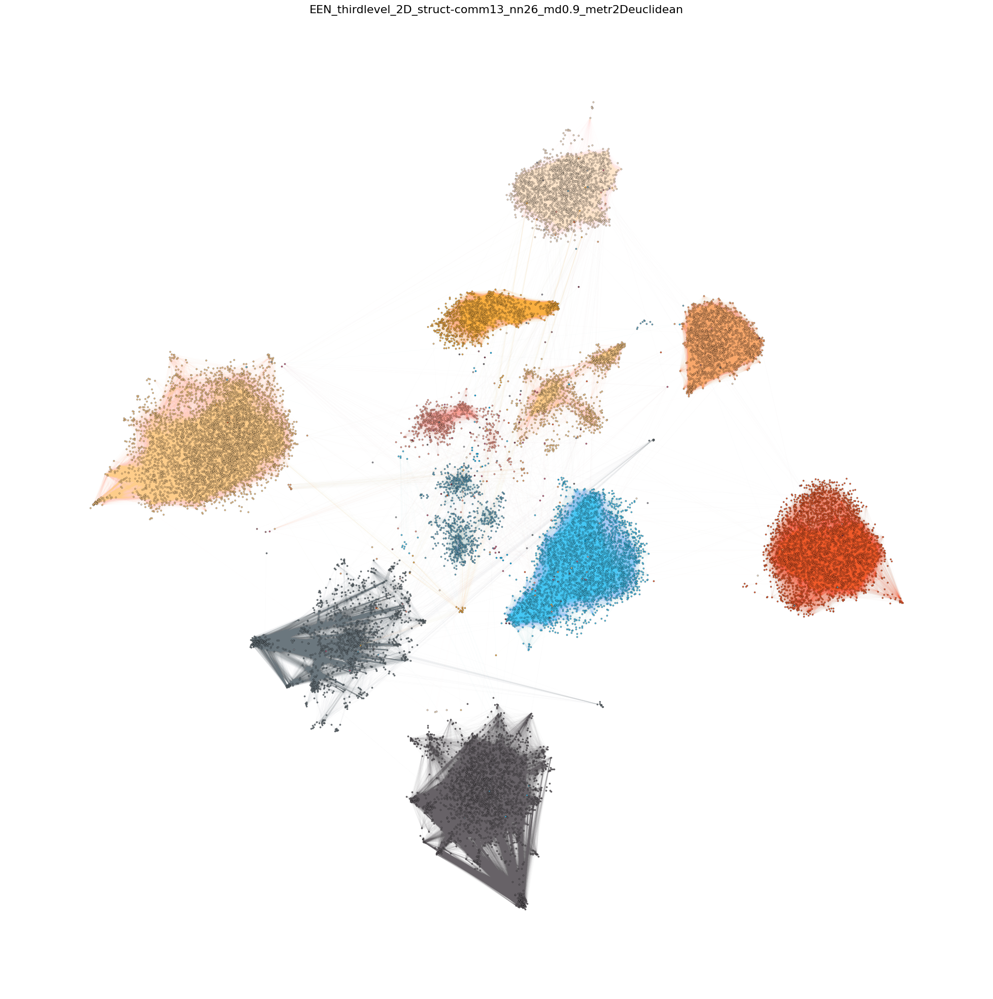

In [25]:
pos2D_allcommunities = []
colors_allcommunities = []

for number_of_community in range(min(d_comm.values()),max(d_comm.values())+1):
    for i,n_comm in enumerate(nodes_allcommunities):
        pos_comm = []
        if i == number_of_community:
            # get positions from community nodes 
            posG2D_comm0 = {}
            for k,v in posG2D_new.items():
                if k in n_comm:
                    posG2D_comm0[k] = v 
        pos_comm.append(posG2D_comm0)

        # get color from community  
        for comm, col in d_comm_col.items():
            if comm == number_of_community:
                comm0_color = col

    pos2D_allcommunities.append(pos_comm)
    colors_allcommunities.append(comm0_color)

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# all edges 
nx.draw_networkx_edges(G,posG2D_new, width = 0.05, edge_color = '#a9a9a9', alpha = 0.01)


# draw network edges within communities 
for i in range(len(subgraphs_allcommunities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), edgecolors = node_edge_col, linewidths = node_linewidth, node_color = colors_allcommunities[i], node_size = 5, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), width = 1, edge_color = colors_allcommunities[i], alpha = 0.01)

plt.box(False)
plt.savefig('output/Figures/SF8A_part1_v02.pdf',dpi=300)
plt.savefig('output/Figures/SF8A_part1_v02.png',dpi=300)
plt.show()

In [20]:
check_colors_allcommunities=[]
for i in range(len(colors_allcommunities)):
    if i==13:    #this corresponds to the community 7
        check_colors_allcommunities.append(colors_allcommunities[13])
    else:
        check_colors_allcommunities.append("grey")

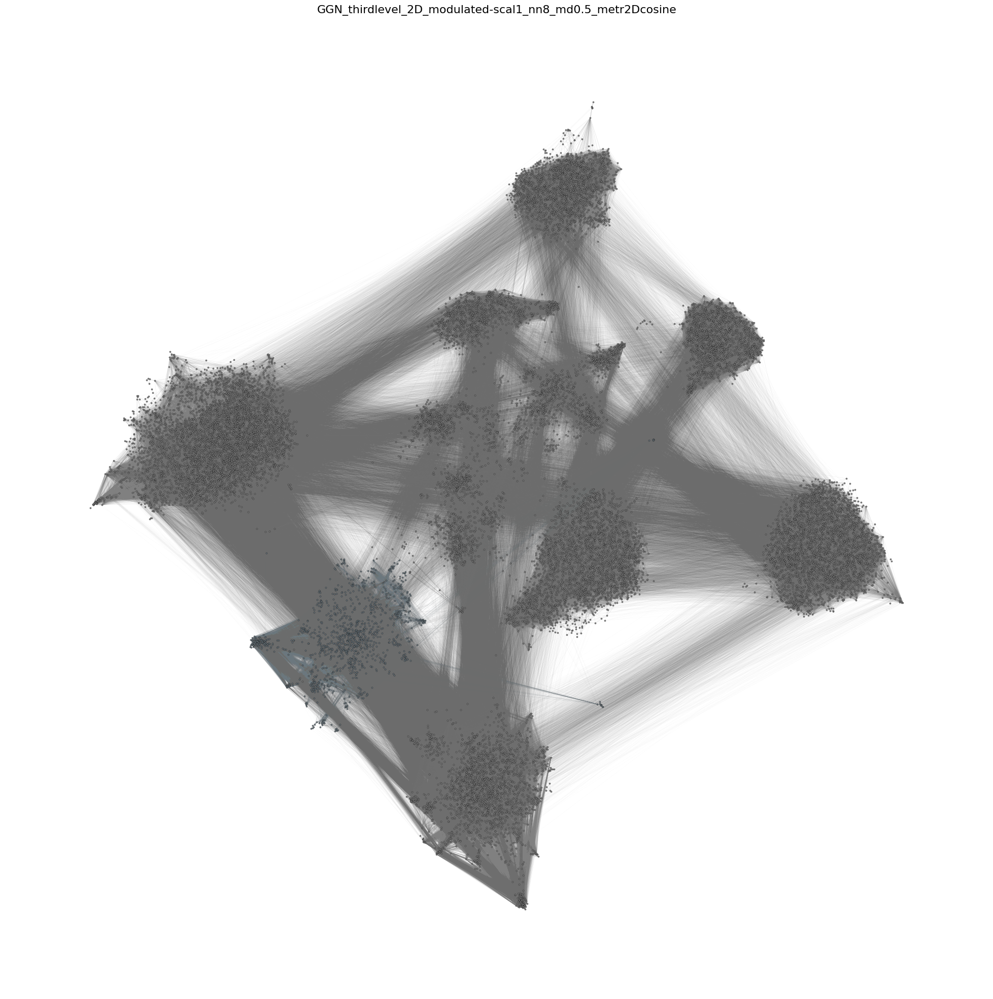

In [21]:
fname = 'GGN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# FIRST: draw network edges all (very transparent)
nx.draw_networkx_edges(G,posG2D_new, width = 0.1, edge_color = '#6C6C6C', alpha = 0.1)

# SECOND: draw network edges within communities 
for i in range(len(subgraphs_allcommunities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), edgecolors = node_edge_col, linewidths = node_linewidth, node_color = check_colors_allcommunities[i], node_size = 5, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), width = 0.5, edge_color = check_colors_allcommunities[i], alpha = 0.075)

plt.box(False)

#plt.savefig(path+fname+'focus.png',dpi=300)
plt.show()

In [13]:
pos2D_allcommunities = []
colors_allcommunities = []

for number_of_community in range(min(d_comm.values()),max(d_comm.values())+1):
    for i,n_comm in enumerate(nodes_allcommunities):
        pos_comm = []
        if i == number_of_community:
            # get positions from community nodes 
            posG2D_comm0 = {}
            for k,v in posG2D_new.items():
                if k in n_comm:
                    posG2D_comm0[k] = v 
        pos_comm.append(posG2D_comm0)

        # get color from community  
        for comm, col in d_comm_col.items():
            if comm == number_of_community:
                comm0_color = col

    pos2D_allcommunities.append(pos_comm)
    colors_allcommunities.append(comm0_color)

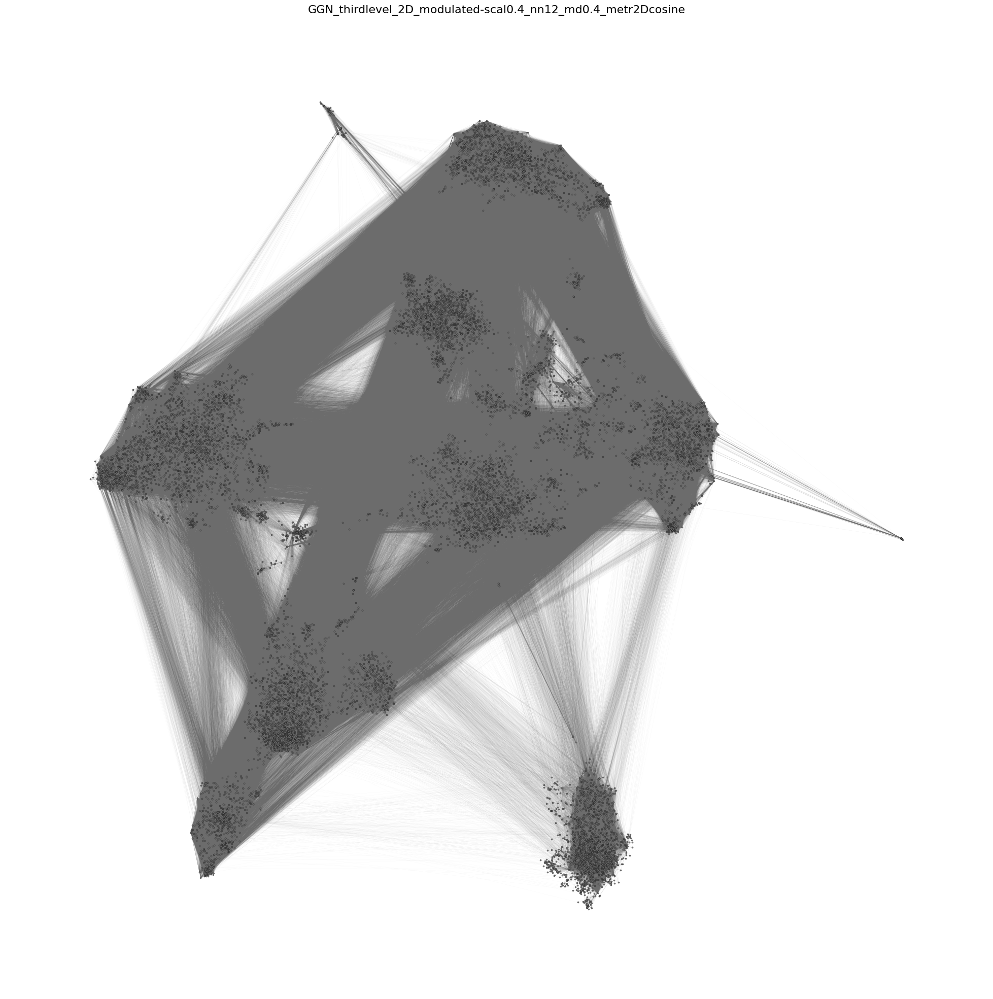

In [14]:
fname = 'GGN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# FIRST: draw network edges all (very transparent)
nx.draw_networkx_edges(G,posG2D_new, width = 0.1, edge_color = '#6C6C6C', alpha = 0.1)

# SECOND: draw network edges within communities 
for i in range(len(subgraphs_allcommunities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), edgecolors = node_edge_col, linewidths = node_linewidth, node_color = '#6C6C6C', node_size = 5, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), width = 0.5, edge_color ='#6C6C6C', alpha = 0.075)

plt.box(False)

#plt.savefig(path+fname+'focus.png',dpi=300)
plt.show()

# Specific Communities per Level - Vis

### THIRD LEVEL

Number of exposures in community: 1282
Specific Graph: Graph with 1282 nodes and 34618 edges


/opt/anaconda3/envs/Exposurome/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



Number of Nodes: (to match G_sub_third nodes):  1282
communities of second level in third level community selected:  {56}
colorlist fin: ['#f9a86b', '#00aeef']
number of unique colors: 2
2
Number of subgraphs: 1
Number of second level communities:  1
Number of position-sublists: 1


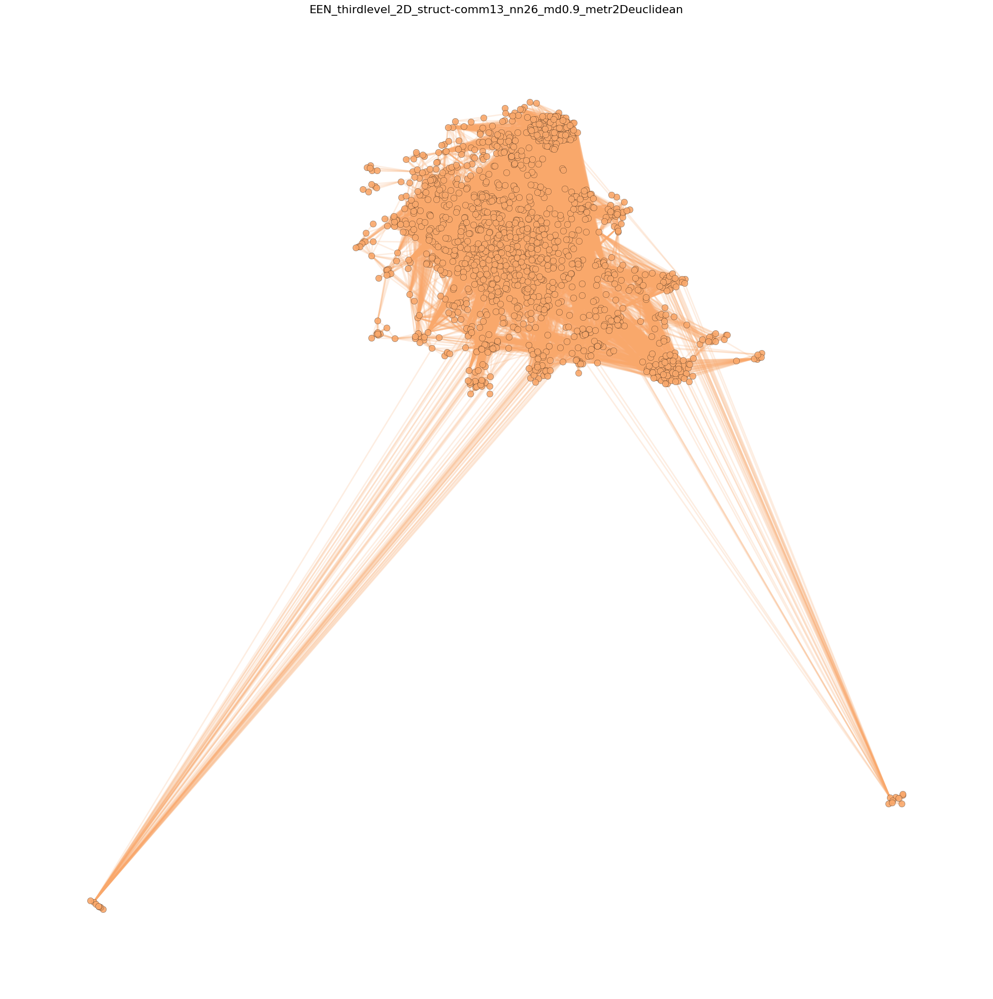

In [35]:
layoutname = 'thirdlevel'

##########################################################
spec_comm_third = 13 #Salvo's selection 7
##########################################################

sublist_third = []
for k,v in d_comm_third.items():
    if v == spec_comm_third:
        sublist_third.append(k)

d_selectedcommunity_thirdlevel = {spec_comm_third:sublist_third}
print("Number of exposures in community:" , len(*d_selectedcommunity_thirdlevel.values()))
###########################################################

# get all subgraphs of all communities : 
nodes_subcommunities = []
subgraphs_subcommunities = []

for number_of_community in range(min(d_comm_third.values()),max(d_comm_third.values())):
    nodes_comm0 = []
    for node, comm in d_comm_third.items(): 
        if comm == number_of_community:
            nodes_comm0.append(node)
            G_comm0 = G.subgraph(nodes_comm0)

    nodes_subcommunities.append(nodes_comm0)
    subgraphs_subcommunities.append(G_comm0)
    
G_sub_third = subgraphs_subcommunities[spec_comm_third]
print("Specific Graph:" , G_sub_third)


########################################
# LAYOUT 
########################################

layout_method = 'struct-comm'+str(spec_comm_third) 

r = 0.9
alpha = 1.0

A_sub = nx.adjacency_matrix(G_sub_third, nodelist=list(G_sub_third.nodes()))
DM_m_sub = rnd_walk_matrix2(A_sub, r, alpha, len(G_sub_third.nodes()))
FM_structural_sub = pd.DataFrame(DM_m_sub)
FM_structural_sub.sum(axis=1) # axis=1 for columns i.e. features = sum 1
FM_structural_sub.index=list(G_sub_third.nodes())
FM_structural_sub.columns=list(G_sub_third.nodes())

n_n = 26 
spr = 1.0
md = 0.9
metr2D = 'euclidean'
posG2D_third = layout_portrait_umap(G_sub_third,
                                   FM_structural_sub, #FM_communities_sub, #df_posG,
                                   2,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

print('Number of Nodes: (to match G_sub_third nodes): ', len(posG2D_third))



########################################
# COLORS 
########################################

# get all nodes of 3rd level subgraph - and their second level assigned communities
d_comm_second_selected = {}
for node in G_sub_third.nodes():
    if node in d_comm_second.keys():    
        d_comm_second_selected[node] = d_comm_second[node]
print("communities of second level in third level community selected: ", set(d_comm_second_selected.values()))

set_communities = set(d_comm_second_selected.values())




colorlist_paper = ['#44c8f5', '#00aeef', '#64a8c5', # blues
                    '#f15a29','#f9a86b', '#ffe6cb' ,#reds
                    '#fbb040', '#fecd8a' , #orange-yellows
                    '#c65d7d', '#f79d8d', '#7a2d45','#a47179', #pinks 
                    '#676267', '#6b777e', '#93909a', '#a7a9ac' #greys    
                ]

colorlist_fin = [colorlist_paper[4],colorlist_paper[1]] # * (len(x_level_louvain.keys())//len(colorlist_paper)) +colorlist_paper
print("colorlist fin:" , colorlist_fin)
# colorlist_fin_rgb = sns.color_palette("gist_rainbow", n_colors = len(x_level_louvain.keys()))
# colorlist_fin = [mcolors.to_hex(rgb) for rgb in colorlist_fin_rgb]
#random.shuffle(colorlist_fin)
print("number of unique colors:" ,len(set(colorlist_fin)))

# assign random color to each community
d_comm_col = dict(zip(x_level_louvain.keys(), colorlist_fin))
print(len(d_comm_col))

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25
edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'



########################################
# subsets according to sublevel communities 
########################################

# get all subgraphs of all communities : 
nodes_allcommunities_secondlevel = []
subgraphs_allcommunities_secondlevel = []

for number_of_community in list(set_communities):
    nodes_comm = []
    for node, comm in d_comm_second.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G_sub_third.subgraph(nodes_comm)

    nodes_allcommunities_secondlevel.append(nodes_comm)
    subgraphs_allcommunities_secondlevel.append(G_comm)
print("Number of subgraphs:", len(subgraphs_allcommunities_secondlevel))
print("Number of second level communities: ", len(nodes_allcommunities_secondlevel))

# get sub of positions according to communities in more detailed level 
pos2D_allcommunities_secondlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_secondlevel):
        pos_comm = []
        if i == idx:
            # get positions from community nodes
            posG2D_comm = {}
            for k,v in posG2D_third.items():
                if k in n_comm:
                    posG2D_comm[k] = v 
        pos_comm.append(posG2D_comm)

    pos2D_allcommunities_secondlevel.append(pos_comm)
print("Number of position-sublists:", len(pos2D_allcommunities_secondlevel))

# colors_allcommunities_secondlevel = []
# for idx,number_of_community in enumerate(list(set_communities)):
#     for i,n_comm in enumerate(nodes_allcommunities_secondlevel):
#         # get color from community  
#         for comm, col in d_comm_col.items():
#             if comm == number_of_community:
#                 comm0_color = col
#     colors_allcommunities_secondlevel.append(comm0_color)

# print("Number of individual colors: ", len(set(colors_allcommunities_secondlevel)))
# print("colors_allcommunities_secondlevel: ", colors_allcommunities_secondlevel)
colors_allcommunities_secondlevel = colorlist_fin
########################################
# PLOT  
########################################

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
#nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.5)

# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_secondlevel[i],
                            dict(*pos2D_allcommunities_secondlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth, 
                            node_color = colors_allcommunities_secondlevel[i], 
                            node_size = 80, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_secondlevel[i],dict(*pos2D_allcommunities_secondlevel[i]), width = 2, edge_color = colors_allcommunities_secondlevel[i], alpha = 0.2)

plt.box(False)


#plt.savefig('output/Figures/SF8A_part2_v02.pdf',dpi=300)
#plt.savefig('output/Figures/SF8A_part2_v02.png',dpi=300)
plt.show()


In [ ]:
# match community colors assigned to nodes-community assignment
d_nodecolors_hex = {} 
for node,comm in d_comm_second_selected.items():
    for com,col in d_comm_col.items():
        if comm == com:
            d_nodecolors_hex[node] = col 

d_nodecolors_hex_sorted = {key:d_nodecolors_hex[key] for key in posG2D_third}

# export postitions 
df_posG_export = pd.DataFrame(posG2D_third).T
df_posG_export[3]= list(d_nodecolors_hex_sorted.values())
df_posG_export
df_posG_export.to_csv('GGN_posG_'+layout_method+'_'+layoutname+'.csv',header=None,index=0)

### SECOND LEVEL

Number of exposures in community: 1282
Specific Graph: Graph with 1282 nodes and 34618 edges
communities of second level in third level community selected:  {128, 256, 3, 263, 264, 138, 142, 144, 16, 146, 19, 276, 21, 22, 153, 162, 166, 167, 168, 46, 178, 56, 185, 194, 201, 202, 204, 81, 210, 209, 212, 86, 214, 219, 220, 222, 95, 228, 229, 243, 248, 127}
{128: '#00aeef', 256: '#02adee', 3: '#04aced', 263: '#06abec', 264: '#07a9ec', 138: '#09a8eb', 142: '#0ba7ea', 144: '#0da6e9', 16: '#0fa5e8', 146: '#11a4e7', 19: '#13a3e6', 276: '#15a2e6', 21: '#16a0e5', 22: '#189fe4', 153: '#1a9ee3', 162: '#1c9de2', 166: '#1e9ce1', 167: '#209be0', 168: '#229ae0', 46: '#2398df', 178: '#2597de', 56: '#2796dd', 185: '#2995dc', 194: '#2b94db', 201: '#2d93db', 202: '#2f92da', 204: '#3191d9', 81: '#328fd8', 210: '#348ed7', 209: '#368dd6', 212: '#388cd5', 86: '#3a8bd5', 214: '#3c8ad4', 219: '#3e89d3', 220: '#3f87d2', 222: '#4186d1', 95: '#4385d0', 228: '#4584cf', 229: '#4783cf', 243: '#4982ce', 248: '#4b81cd

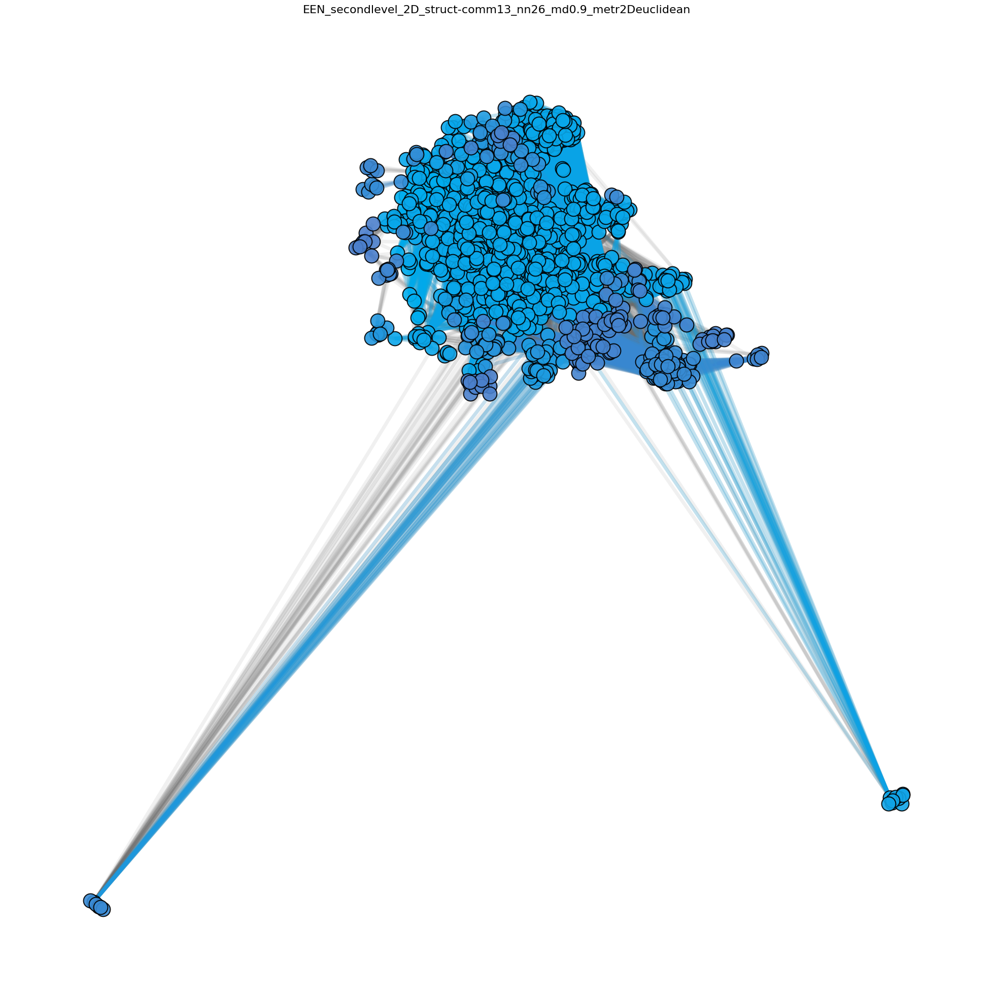

In [36]:
layoutname = 'secondlevel'

##########################################################
spec_comm_second = 56 #Salvo's selection 22 (10_2)
##########################################################


sublist_second = []
for k,v in d_comm_second.items():
    if v == spec_comm_second:
        sublist_second.append(k)

d_selectedcommunity_secondlevel = {spec_comm_second:sublist_second}
print("Number of exposures in community:" , len(*d_selectedcommunity_secondlevel.values()))
###########################################################

# get all subgraphs of all communities : 
nodes_subcommunities = []
subgraphs_subcommunities = []

for number_of_community in range(min(d_comm_second.values()),max(d_comm_second.values())):
    nodes_comm = []
    for node, comm in d_comm_second.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G.subgraph(nodes_comm)

    nodes_subcommunities.append(nodes_comm)
    subgraphs_subcommunities.append(G_comm)
    
G_sub_second = subgraphs_subcommunities[spec_comm_second]
print("Specific Graph:" , G_sub_second)


# ########################################
# # LAYOUT 
# ########################################

# layout_method = 'struct-comm'+str(spec_comm_second) 

# r = 0.9
# alpha = 1.0

# A_sub = nx.adjacency_matrix(G_sub_second, nodelist=list(G_sub_second.nodes()))
# DM_m_sub = rnd_walk_matrix2(A_sub, r, alpha, len(G_sub_second.nodes()))
# FM_structural_sub = pd.DataFrame(DM_m_sub)
# FM_structural_sub.sum(axis=1) # axis=1 for columns i.e. features = sum 1
# FM_structural_sub.index=list(G_sub_second.nodes())
# FM_structural_sub.columns=list(G_sub_second.nodes())

# n_n = 50
# spr = 1.0
# md = 0.9
# metr2D = 'cosine'
# posG2D_second = layout_portrait_umap(G_sub_second,
#                                    FM_structural_sub, #FM_communities_sub, #df_posG,
#                                    2,
#                                    n_neighbors=n_n, 
#                                    spread=spr, 
#                                    min_dist=md, 
#                                    metric=metr2D
#                                   )

# print('Number of Nodes: (to match G_sub_second nodes): ', len(posG2D_second))


# # add a small number to all positions to move them away from each other 
# posG2D_third_mod = {}
# for k,v in posG2D_third.items():
#     jitter = random.uniform(0,0.02)

#     posG2D_third_mod[k] = (v[0]+jitter, v[1]+jitter)
    

########################################
# COLORS 
########################################

# get all nodes of 2nd level subgraph - and their first level assigned communities
d_comm_first_selected = {}
for node in G_sub_second.nodes():
    if node in d_comm_first.keys():    
        d_comm_first_selected[node] = d_comm_first[node]
print("communities of second level in third level community selected: ", set(d_comm_first_selected.values()))

set_communities = set(d_comm_first_selected.values())

# get color of community of previous level
# then generate gradients of this color based on number of communities in this level
color_previous = colorlist_fin[1] #d_comm_col[spec_comm_third]
num_colors = len(set(d_comm_first_selected.values()))
color_rgb = mcolors.hex2color(color_previous)


end_color = (0.0,0.1,0.4) # You can change this to (0, 0, 0) for a dark palette or any other color
end_color = (0.3,0.5,0.8) # You can change this to (0, 0, 0) for a dark palette or any other color


colorlist_rgb = [np.array(color_rgb) * (1 - i) + np.array(end_color) * i for i in np.linspace(0, 1, num_colors)]
colorlist_hex = [mcolors.to_hex(rgb) for rgb in colorlist_rgb]
d_comm_col = dict(zip(set_communities, colorlist_hex))
print(d_comm_col) 

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25
edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'


#########################################
# subsets according to sublevel communities 
########################################

# get all subgraphs of all communities : 
nodes_allcommunities_firstlevel = []
subgraphs_allcommunities_firstlevel = []

for number_of_community in list(set_communities):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G_sub_second.subgraph(nodes_comm)

    nodes_allcommunities_firstlevel.append(nodes_comm)
    subgraphs_allcommunities_firstlevel.append(G_comm)
print("Number of subgraphs:", len(subgraphs_allcommunities_firstlevel))
print("Number of second level communities: ", len(nodes_allcommunities_firstlevel))

# get sub of positions according to communities in more detailed level 
pos2D_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        pos_comm = []
        if i == idx:
            # get positions from community nodes
            posG2D_comm = {}
            for k,v in posG2D_third.items(): # or use posG2D_second if positions should be newly calculated
                if k in n_comm:
                    posG2D_comm[k] = v 
        pos_comm.append(posG2D_comm)

    pos2D_allcommunities_firstlevel.append(pos_comm)
print("Number of position-sublists:", len(pos2D_allcommunities_firstlevel))

colors_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        # get color from community  
        for comm, col in d_comm_col.items():
            if comm == number_of_community:
                comm0_color = col
    colors_allcommunities_firstlevel.append(comm0_color)

print("Number of individual colors: ", len(set(colors_allcommunities_firstlevel)))



#######################################
# PLOT  
########################################

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
#nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.1)

# draw network edges accross communities 
nx.draw_networkx_edges(G_sub_second, posG2D_third, width = 5, edge_color = '#6C6C6C', alpha = 0.1)

# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            dict(*pos2D_allcommunities_firstlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*6, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 400, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],dict(*pos2D_allcommunities_firstlevel[i]), width = 5.0, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)

plt.box(False)


#plt.savefig('output/Figures/SF8A_part2_v03.pdf',dpi=300)
#plt.savefig('output/Figures/SF8A_part2_v03.png',dpi=300)
plt.show()

### FIRST LEVEL

Number of exposures in community: 13
Specific Graph: Graph with 13 nodes and 70 edges
communities of second level in third level community selected:  {229}
{229: '#4783cf'}
Number of subgraphs: 1
Number of second level communities:  1
Number of position-sublists: 1
Number of individual colors:  1


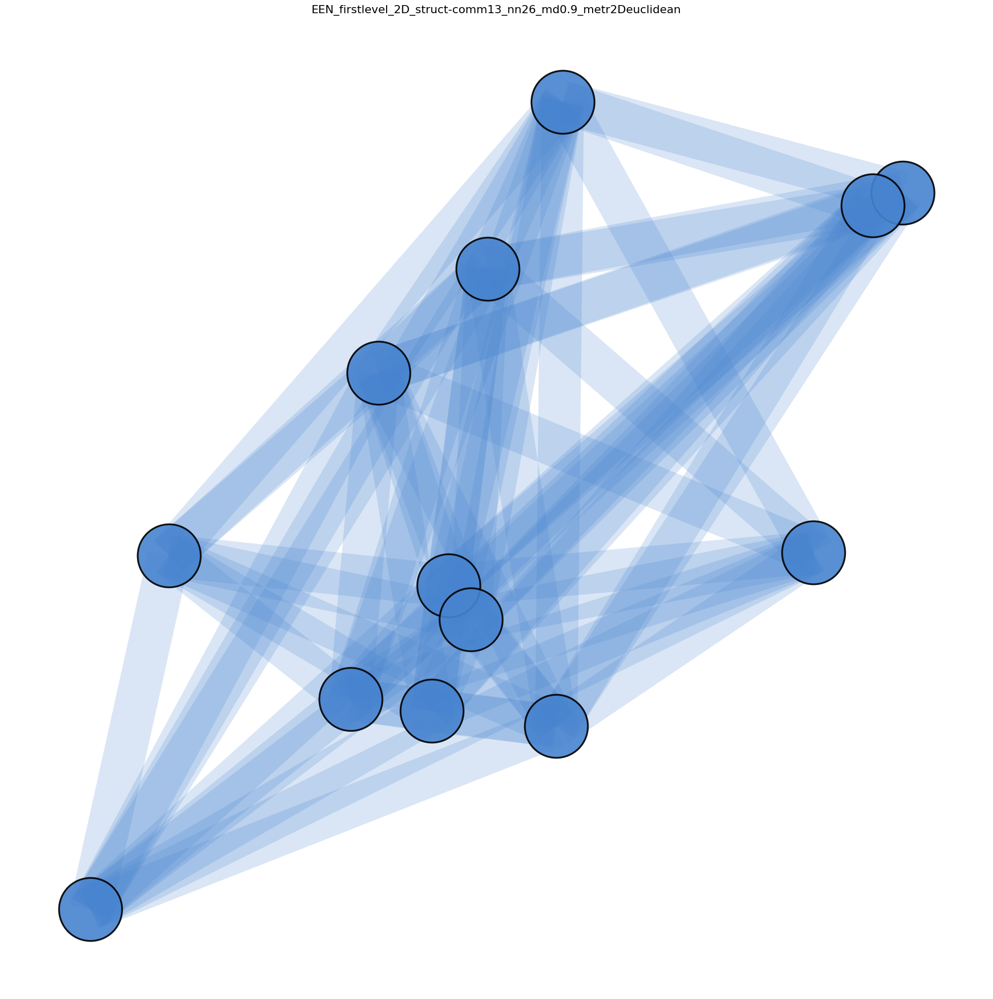

In [28]:
layoutname = 'firstlevel'

##########################################################
spec_comm_first = 229 #Salvo's selection 7_10
##########################################################

sublist_first = []
for k,v in d_comm_first.items():
    if v == spec_comm_first:
        sublist_first.append(k)

d_selectedcommunity_firstlevel = {spec_comm_first:sublist_first}
print("Number of exposures in community:" , len(*d_selectedcommunity_firstlevel.values()))
###########################################################

# get all subgraphs of all communities : 
nodes_subcommunities = []
subgraphs_subcommunities = []

for number_of_community in range(min(d_comm_first.values()),max(d_comm_first.values())):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G.subgraph(nodes_comm)

    nodes_subcommunities.append(nodes_comm)
    subgraphs_subcommunities.append(G_comm)
    
G_sub_first = subgraphs_subcommunities[spec_comm_first]
print("Specific Graph:" , G_sub_first)


# ########################################
# # LAYOUT 
# ########################################

# layout_method = 'struct-comm'+str(spec_comm_first) 

# r = 0.9
# alpha = 1.0

# A_sub = nx.adjacency_matrix(G_sub_first, nodelist=list(G_sub_first.nodes()))
# DM_m_sub = rnd_walk_matrix2(A_sub, r, alpha, len(G_sub_first.nodes()))
# FM_structural_sub = pd.DataFrame(DM_m_sub)
# FM_structural_sub.sum(axis=1) # axis=1 for columns i.e. features = sum 1
# FM_structural_sub.index=list(G_sub_first.nodes())
# FM_structural_sub.columns=list(G_sub_first.nodes())

# n_n = 4
# spr = 1.0
# md = 0.1
# metr2D = 'cosine'
# posG2D_first = layout_portrait_umap(G_sub_first,
#                                    FM_structural_sub, #FM_communities_sub, #df_posG,
#                                    2,
#                                    n_neighbors=n_n, 
#                                    spread=spr, 
#                                    min_dist=md, 
#                                    metric=metr2D
#                                   )

# print('Number of Nodes: (to match G_sub_first nodes): ', len(posG2D_first))

########################################
# COLORS 
########################################


d_comm_first_selected = {}
for node in G_sub_first.nodes():
    d_comm_first_selected[node] = d_comm_first[node]
print("communities of second level in third level community selected: ", set(d_comm_first_selected.values()))

set_communities = set(d_comm_first_selected.values())

# get color of community of previous level
# then generate gradients of this color based on number of communities in this level
color_previous = d_comm_col[spec_comm_first]
num_colors = len(set(d_comm_first_selected.values()))
color_rgb = mcolors.hex2color(color_previous)
end_color = (0.5,0.5,0.5) # You can change this to (0, 0, 0) for a dark palette or any other color
colorlist_rgb = [np.array(color_rgb) * (1 - i) + np.array(end_color) * i for i in np.linspace(0, 1, num_colors)]
colorlist_hex = [mcolors.to_hex(rgb) for rgb in colorlist_rgb]
d_comm_col = dict(zip(set_communities, colorlist_hex))
print(d_comm_col) 





# assign previously assigned color (to remain same)
d_comm_col_new = {spec_comm_first:d_comm_col[spec_comm_first]} # dict(zip(set_communities , colorlist_fin))

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25
edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'


#########################################
# subsets according to sublevel communities 
########################################

# get all subgraphs of all communities : 
nodes_allcommunities_firstlevel = []
subgraphs_allcommunities_firstlevel = []

for number_of_community in list(set_communities):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G_sub_second.subgraph(nodes_comm)

    nodes_allcommunities_firstlevel.append(nodes_comm)
    subgraphs_allcommunities_firstlevel.append(G_comm)
print("Number of subgraphs:", len(subgraphs_allcommunities_firstlevel))
print("Number of second level communities: ", len(nodes_allcommunities_firstlevel))

# get sub of positions according to communities in more detailed level 
pos2D_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        pos_comm = []
        if i == idx:
            # get positions from community nodes
            posG2D_comm = {}
            for k,v in posG2D_third.items(): # or use posG2D_third/second/first
                if k in n_comm:
                    posG2D_comm[k] = v 
        pos_comm.append(posG2D_comm)

    pos2D_allcommunities_firstlevel.append(pos_comm)
print("Number of position-sublists:", len(pos2D_allcommunities_firstlevel))

colors_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        # get color from community  
        for comm, col in d_comm_col_new.items():
            if comm == number_of_community:
                comm0_color = col
    colors_allcommunities_firstlevel.append(comm0_color)

print("Number of individual colors: ", len(set(colors_allcommunities_firstlevel)))


#######################################
# PLOT  
########################################

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
#nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.1)


# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            dict(*pos2D_allcommunities_firstlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*10, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 8000, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],dict(*pos2D_allcommunities_firstlevel[i]), width = 60, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)

plt.box(False)


plt.savefig('output/Figures/SF8A_part3_v03.pdf',dpi=300)
plt.savefig('output/Figures/SF8A_part3_v03.png',dpi=300)
plt.show()

Number of exposures in community: 13
Specific Graph: Graph with 13 nodes and 70 edges


/Users/lsd/anaconda3/envs/Exposurome/lib/python3.10/site-packages/umap/umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



Number of Nodes: (to match G_sub_first nodes):  13
communities of second level in third level community selected:  {229}
number of unique colors: 1
Number of subgraphs: 1
Number of second level communities:  1
Number of position-sublists: 1
Number of individual colors:  1


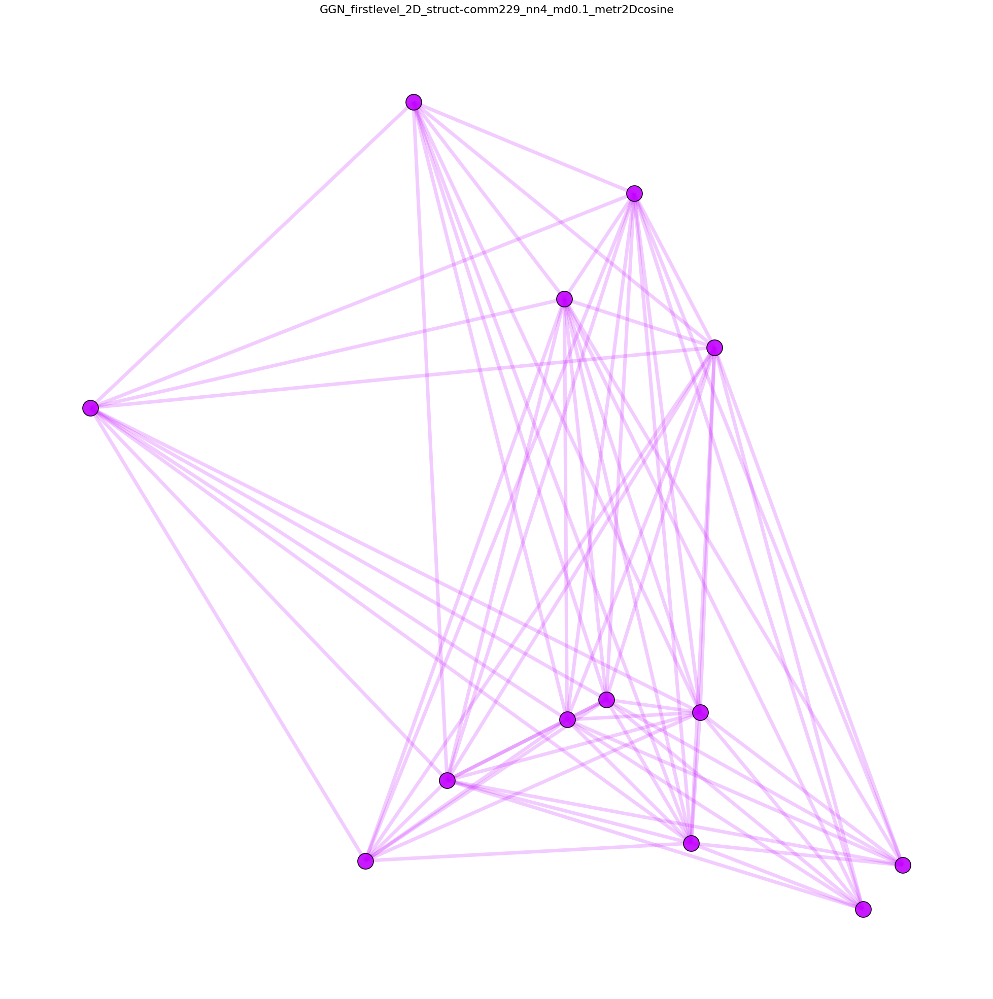

In [73]:
layoutname = 'firstlevel'

##########################################################
spec_comm_first = 229 #Salvo's selection 7_10
##########################################################

sublist_first = []
for k,v in d_comm_first.items():
    if v == spec_comm_first:
        sublist_first.append(k)

d_selectedcommunity_firstlevel = {spec_comm_first:sublist_first}
print("Number of exposures in community:" , len(*d_selectedcommunity_firstlevel.values()))
###########################################################

# get all subgraphs of all communities : 
nodes_subcommunities = []
subgraphs_subcommunities = []

for number_of_community in range(min(d_comm_first.values()),max(d_comm_first.values())+1):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G.subgraph(nodes_comm)

    nodes_subcommunities.append(nodes_comm)
    subgraphs_subcommunities.append(G_comm)
    
G_sub_first = subgraphs_subcommunities[spec_comm_first]
print("Specific Graph:" , G_sub_first)


########################################
# LAYOUT 
########################################

layout_method = 'struct-comm'+str(spec_comm_first) 

r = 0.9
alpha = 1.0

A_sub = nx.adjacency_matrix(G_sub_first, nodelist=list(G_sub_first.nodes()))
DM_m_sub = rnd_walk_matrix2(A_sub, r, alpha, len(G_sub_first.nodes()))
FM_structural_sub = pd.DataFrame(DM_m_sub)
FM_structural_sub.sum(axis=1) # axis=1 for columns i.e. features = sum 1
FM_structural_sub.index=list(G_sub_first.nodes())
FM_structural_sub.columns=list(G_sub_first.nodes())

n_n = 4
spr = 1.0
md = 0.1
metr2D = 'cosine'
posG2D_first = layout_portrait_umap(G_sub_first,
                                   FM_structural_sub, #FM_communities_sub, #df_posG,
                                   2,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

print('Number of Nodes: (to match G_sub_first nodes): ', len(posG2D_first))

########################################
# COLORS 
########################################

d_comm_first_selected = {}
for node in G_sub_first.nodes():
    d_comm_first_selected[node] = d_comm_first[node]
print("communities of second level in third level community selected: ", set(d_comm_first_selected.values()))

set_communities = set(d_comm_first_selected.values())

# get unique color for each community 
colorlist_fin_rgb = sns.color_palette("gist_rainbow", n_colors = len(set_communities))
colorlist_fin = [mcolors.to_hex(rgb) for rgb in colorlist_fin_rgb]
#random.shuffle(colorlist_fin)
print("number of unique colors:" ,len(set(colorlist_fin)))

# assign previously assigned color (to remain same)
d_comm_col_new = {spec_comm_first:d_comm_col[spec_comm_first]} # dict(zip(set_communities , colorlist_fin))

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25
edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'


#########################################
# subsets according to sublevel communities 
########################################

# get all subgraphs of all communities : 
nodes_allcommunities_firstlevel = []
subgraphs_allcommunities_firstlevel = []

for number_of_community in list(set_communities):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G_sub_second.subgraph(nodes_comm)

    nodes_allcommunities_firstlevel.append(nodes_comm)
    subgraphs_allcommunities_firstlevel.append(G_comm)
print("Number of subgraphs:", len(subgraphs_allcommunities_firstlevel))
print("Number of second level communities: ", len(nodes_allcommunities_firstlevel))

# get sub of positions according to communities in more detailed level 
pos2D_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        pos_comm = []
        if i == idx:
            # get positions from community nodes
            posG2D_comm = {}
            for k,v in posG2D_third.items(): # or use posG2D_third/second/first
                if k in n_comm:
                    posG2D_comm[k] = v 
        pos_comm.append(posG2D_comm)

    pos2D_allcommunities_firstlevel.append(pos_comm)
print("Number of position-sublists:", len(pos2D_allcommunities_firstlevel))

colors_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        # get color from community  
        for comm, col in d_comm_col_new.items():
            if comm == number_of_community:
                comm0_color = col
    colors_allcommunities_firstlevel.append(comm0_color)

print("Number of individual colors: ", len(set(colors_allcommunities_firstlevel)))


#######################################
# PLOT  
########################################

fname = 'GGN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
#nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.1)


# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            dict(*pos2D_allcommunities_firstlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*5, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 500, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],dict(*pos2D_allcommunities_firstlevel[i]), width = 2.0*2.5, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)

plt.box(False)

#plt.savefig('output/Figures/SF8A_part3_v01.pdf',dpi=300)
plt.show()

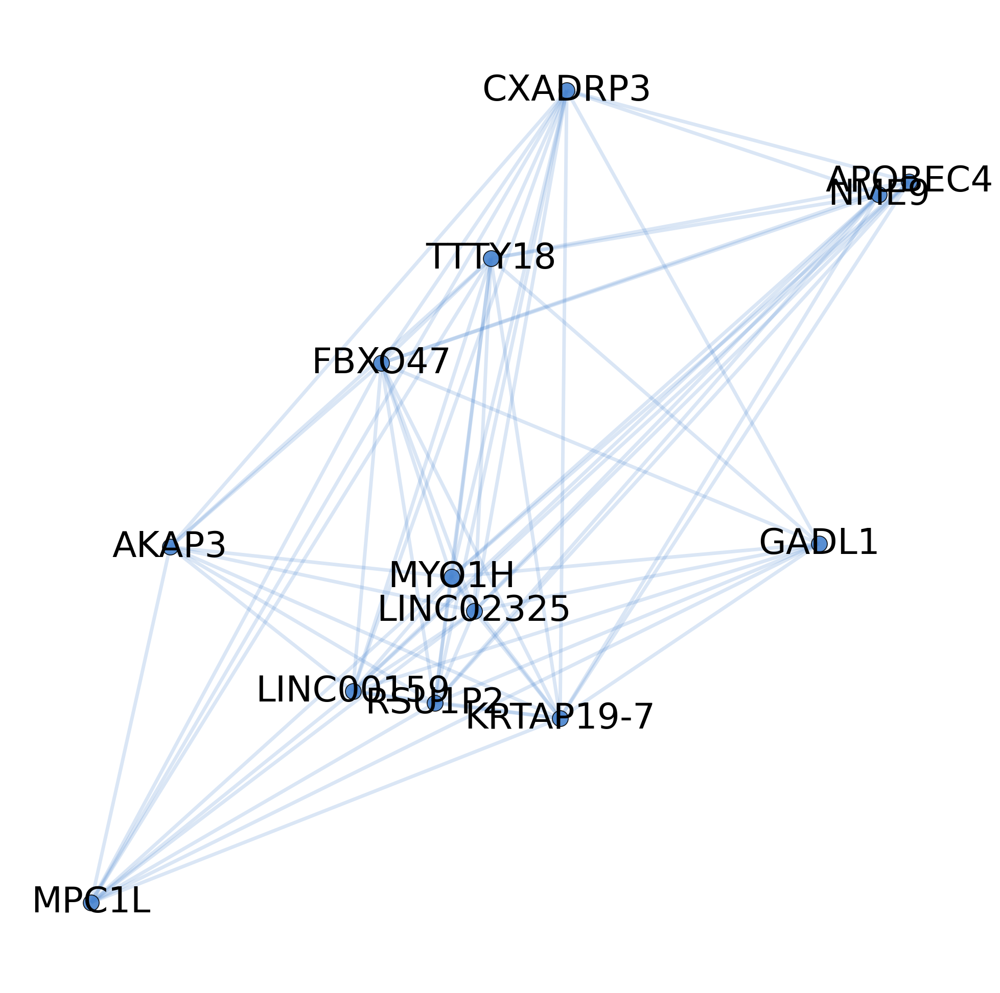

In [30]:
plt.figure(figsize=(25,25))
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            dict(*pos2D_allcommunities_firstlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*5, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 500, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],dict(*pos2D_allcommunities_firstlevel[i]), width = 2.0*2.5, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)
    nx.draw_networkx_labels(subgraphs_allcommunities_firstlevel[i], dict(*pos2D_allcommunities_firstlevel[i]),  font_color = 'black',font_size=50)
plt.box(False)
plt.savefig('output/Figures/SF8A_part3_v03_ann.png',dpi=300)
plt.show()

Number of exposures in community: 16
Specific Graph: Graph with 16 nodes and 103 edges


/opt/anaconda3/envs/Exposurome/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



Number of Nodes: (to match G_sub_first nodes):  16
communities of second level in third level community selected:  {248}
number of unique colors: 1
Number of subgraphs: 1
Number of second level communities:  1
Number of position-sublists: 1
Number of individual colors:  1


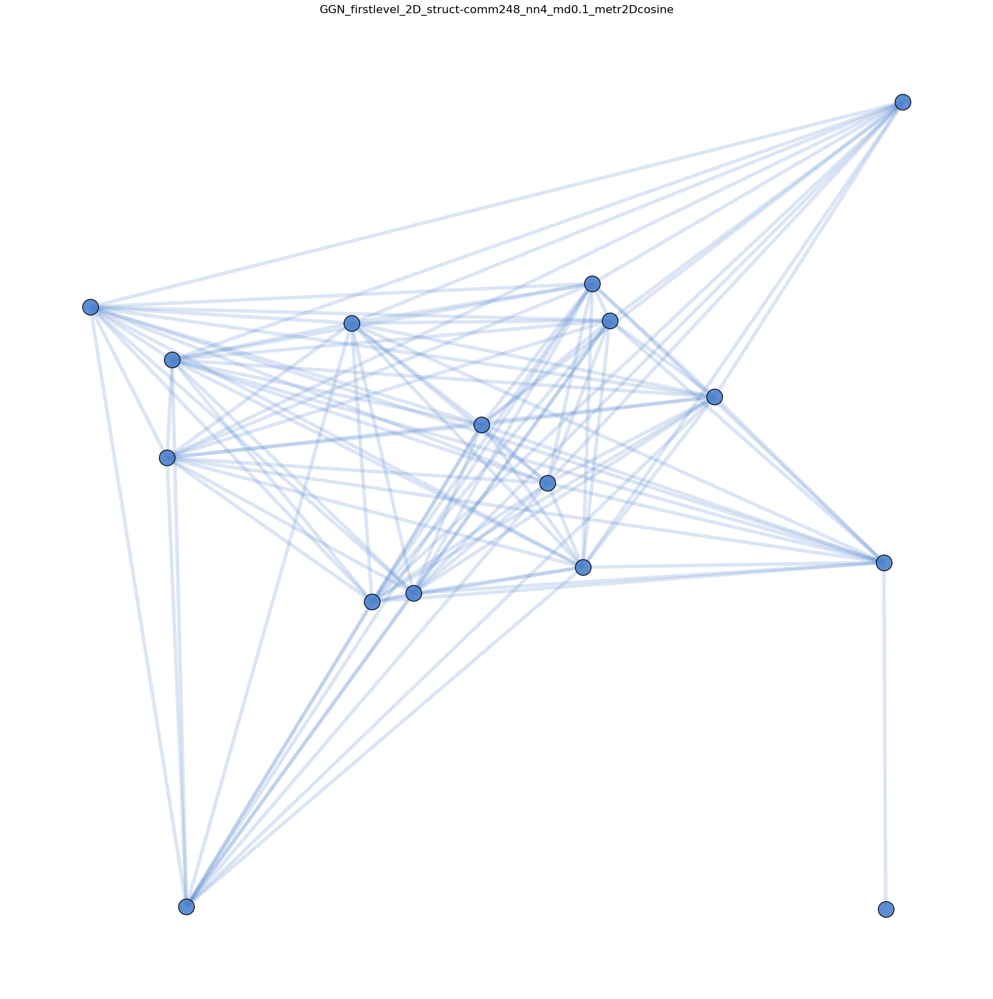

In [37]:
layoutname = 'firstlevel'

##########################################################
spec_comm_first = 248 #Salvo's selection 7_9
##########################################################

sublist_first = []
for k,v in d_comm_first.items():
    if v == spec_comm_first:
        sublist_first.append(k)

d_selectedcommunity_firstlevel = {spec_comm_first:sublist_first}
print("Number of exposures in community:" , len(*d_selectedcommunity_firstlevel.values()))
###########################################################

# get all subgraphs of all communities : 
nodes_subcommunities = []
subgraphs_subcommunities = []

for number_of_community in range(min(d_comm_first.values()),max(d_comm_first.values())+1):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G.subgraph(nodes_comm)

    nodes_subcommunities.append(nodes_comm)
    subgraphs_subcommunities.append(G_comm)
    
G_sub_first = subgraphs_subcommunities[spec_comm_first]
print("Specific Graph:" , G_sub_first)


########################################
# LAYOUT 
########################################

layout_method = 'struct-comm'+str(spec_comm_first) 

r = 0.9
alpha = 1.0

A_sub = nx.adjacency_matrix(G_sub_first, nodelist=list(G_sub_first.nodes()))
DM_m_sub = rnd_walk_matrix2(A_sub, r, alpha, len(G_sub_first.nodes()))
FM_structural_sub = pd.DataFrame(DM_m_sub)
FM_structural_sub.sum(axis=1) # axis=1 for columns i.e. features = sum 1
FM_structural_sub.index=list(G_sub_first.nodes())
FM_structural_sub.columns=list(G_sub_first.nodes())

n_n = 4
spr = 1.0
md = 0.1
metr2D = 'cosine'
posG2D_first = layout_portrait_umap(G_sub_first,
                                   FM_structural_sub, #FM_communities_sub, #df_posG,
                                   2,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

print('Number of Nodes: (to match G_sub_first nodes): ', len(posG2D_first))

########################################
# COLORS 
########################################

d_comm_first_selected = {}
for node in G_sub_first.nodes():
    d_comm_first_selected[node] = d_comm_first[node]
print("communities of second level in third level community selected: ", set(d_comm_first_selected.values()))

set_communities = set(d_comm_first_selected.values())

# get unique color for each community 
colorlist_fin_rgb = sns.color_palette("gist_rainbow", n_colors = len(set_communities))
colorlist_fin = [mcolors.to_hex(rgb) for rgb in colorlist_fin_rgb]
#random.shuffle(colorlist_fin)
print("number of unique colors:" ,len(set(colorlist_fin)))

# assign previously assigned color (to remain same)
d_comm_col_new = {spec_comm_first:d_comm_col[spec_comm_first]} # dict(zip(set_communities , colorlist_fin))

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25
edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'


#########################################
# subsets according to sublevel communities 
########################################

# get all subgraphs of all communities : 
nodes_allcommunities_firstlevel = []
subgraphs_allcommunities_firstlevel = []

for number_of_community in list(set_communities):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G_sub_second.subgraph(nodes_comm)

    nodes_allcommunities_firstlevel.append(nodes_comm)
    subgraphs_allcommunities_firstlevel.append(G_comm)
print("Number of subgraphs:", len(subgraphs_allcommunities_firstlevel))
print("Number of second level communities: ", len(nodes_allcommunities_firstlevel))

# get sub of positions according to communities in more detailed level 
pos2D_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        pos_comm = []
        if i == idx:
            # get positions from community nodes
            posG2D_comm = {}
            for k,v in posG2D_third.items(): # or use posG2D_third/second/first
                if k in n_comm:
                    posG2D_comm[k] = v 
        pos_comm.append(posG2D_comm)

    pos2D_allcommunities_firstlevel.append(pos_comm)
print("Number of position-sublists:", len(pos2D_allcommunities_firstlevel))

colors_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        # get color from community  
        for comm, col in d_comm_col_new.items():
            if comm == number_of_community:
                comm0_color = col
    colors_allcommunities_firstlevel.append(comm0_color)

print("Number of individual colors: ", len(set(colors_allcommunities_firstlevel)))


#######################################
# PLOT  
########################################

fname = 'GGN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
#nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.1)


# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            dict(*pos2D_allcommunities_firstlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*5, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 500, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],dict(*pos2D_allcommunities_firstlevel[i]), width = 2.0*2.5, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)

plt.box(False)

plt.savefig('output/Figures/SF8A_part4_v01.pdf',dpi=300)
plt.show()

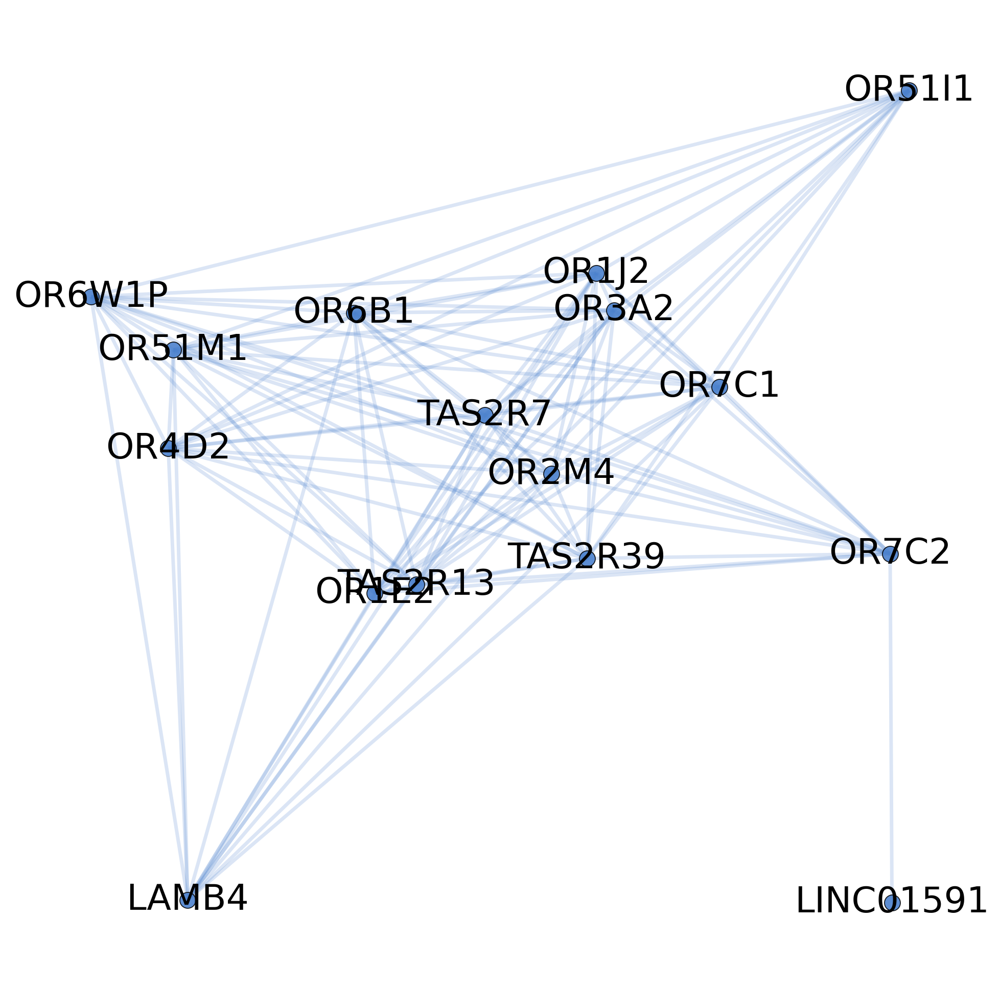

In [38]:
plt.figure(figsize=(25,25))
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            dict(*pos2D_allcommunities_firstlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*5, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 500, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],dict(*pos2D_allcommunities_firstlevel[i]), width = 2.0*2.5, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)
    nx.draw_networkx_labels(subgraphs_allcommunities_firstlevel[i], dict(*pos2D_allcommunities_firstlevel[i]),  font_color = 'black',font_size=50)
plt.box(False)
plt.savefig('output/Figures/SF8A_part4_v03_ann.png',dpi=300)
plt.show()